# Description

Here we test tensor basis random forest on the 2-dimensional turbulence dataset.

# Import

In [1]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from modules.tbdt_v8 import TBDT
from modules.tbrf_v4 import TBRF

In [2]:
dataset = 'kepsilon'

# Loading data - select which cases to include in the training/validation set (commented out cases are held out)
cases = ['DUCT_1100',
         'DUCT_1150',
         'DUCT_1250',
         'DUCT_1300',
         'DUCT_1350',
         'DUCT_1400',
         'DUCT_1500',
         'DUCT_1600',
         'DUCT_1800',
         #'DUCT_2000',
         'DUCT_2205',
         'DUCT_2400',
         'DUCT_2600',
         'DUCT_2900',
         'DUCT_3200',
         #'DUCT_3500',
         'PHLL_case_0p5',
         'PHLL_case_0p8',
         'PHLL_case_1p0',
         #'PHLL_case_1p2',
         'PHLL_case_1p5',
         'BUMP_h20',
         'BUMP_h26',
         'BUMP_h31',
         #'BUMP_h38',
         'BUMP_h42',
         'CNDV_12600',
         'CNDV_20580',
         'CBFS_13700'
         ]

In [3]:
#Convenient functions for loading dataset
def loadCombinedArray(cases,field):
    data = np.concatenate([np.load('../data/'+dataset+'/'+dataset+'_'+case+'_'+field + '.npy', allow_pickle=True) for case in cases])
    return data

In [4]:
def loadLabels(cases,field):
    data = np.concatenate([np.load('../data/'+'labels/'+case+'_'+field + '.npy') for case in cases])
    return data

In [5]:
print('Loading features and labels from the dataset: '+ dataset)

Loading features and labels from the dataset: kepsilon


In [6]:
#Load the set of ten basis tensors (N,10,3,3), from Pope "A more general effective-viscosity hypothesis" (1975).
Tensors = loadCombinedArray(cases,'Tensors')
print('Shape of basis tensor array: '+str(Tensors.shape))

Shape of basis tensor array: (791490, 10, 3, 3)


In [7]:
#Load the 47 invariants (N,47) used by Wu et al. "Physics-informed machine learning approach for augmenting turbulence models: A comprehensive framework" (2018)
Invariants = loadCombinedArray(cases,'I1')
print('Shape of invariant features array: '+str(Invariants.shape))

Shape of invariant features array: (791490, 47)


In [8]:
# #Load the additional scalars (N,5): 
# Scalars = loadCombinedArray(cases,'q')
# print('Shape of scalar features array: '+str(Scalars.shape))

In [9]:
Features = Invariants.copy()
print('Shape of combined features array: '+str(Features.shape))

Shape of combined features array: (791490, 47)


# Data processing

In [10]:
def remove_outliers(Features):
    stdev = np.std(Features,axis=0)
    means = np.mean(Features,axis=0)
    ind_drop = np.empty(0)
    for i in range(len(Features[0,:])):
        ind_drop = np.concatenate((ind_drop,np.where((Features[:,i]>means[i]+5*stdev[i]) | (Features[:,i]<means[i]-5*stdev[i]) )[0]))
    return ind_drop.astype(int)

outlier_removal_switch = 0
if outlier_removal_switch == 1:
    outlier_index = remove_outliers(Features)
    print('Found '+str(len(outlier_index))+' outliers in the input feature set')
    Features = np.delete(Features,outlier_index,axis=0)
    Tensors = np.delete(Tensors,outlier_index,axis=0)
    Labels = np.delete(Labels,outlier_index,axis=0)


In [11]:
#Load the label set from DNS/LES:
Labels = loadLabels(cases,'b')
#If desired, reshape the 3x3 symmetric anisotropy tensor into a 1x6 vector
# Labels = np.delete(Labels.reshape((len(Labels),9)),[3,6,7],axis=1)
print('Shape of DNS/LES labels array: '+str(Labels.shape))

Shape of DNS/LES labels array: (791490, 3, 3)


In [12]:
indices = np.arange(Features.shape[0])

In [13]:
x_train, x_val, y_train, y_val, ind_train, ind_val = train_test_split(Features, Labels, indices, test_size=0.2, random_state=10, shuffle=True)

In [14]:
basis_train = Tensors[ind_train]
basis_val = Tensors[ind_val]

In [15]:
# scaler = StandardScaler()
# x_train = scaler.fit_transform(x_train)
# x_val = scaler.transform(x_val)

In [16]:
print(' ')
print('Training features:')
print(x_train.shape)
print('Training tensor basis:')
print(basis_train.shape)
print('Training labels:')
print(y_train.shape)
print(' ')
print('Validation features:')
print(x_val.shape)
print('Validation tensor basis:')
print(basis_val.shape)
print('Validation labels:')
print(y_val.shape)
print(' ')

 
Training features:
(633192, 47)
Training tensor basis:
(633192, 10, 3, 3)
Training labels:
(633192, 3, 3)
 
Validation features:
(158298, 47)
Validation tensor basis:
(158298, 10, 3, 3)
Validation labels:
(158298, 3, 3)
 


# Tensor Basis Neural Network

In [17]:
regularization = True
regularization_lambda = 1e-9
write_g = False  # write tensor basis coefficient fields
splitting_features = 10  # 'all', 'div3', 'sqrt', or an integer value
min_samples_leaf = 30
n_trees = 10
read_treefile = False

tree_filename = 'data/TBRF/TBRF_TREE%i'

tbrf = TBRF(min_samples_leaf=min_samples_leaf, tree_filename=tree_filename, n_trees=n_trees,
            regularization=regularization,
            regularization_lambda=regularization_lambda, splitting_features=splitting_features,
            optim_split=True, optim_threshold=100, read_from_file=read_treefile)

In [18]:
forest = tbrf.fit(x_train.T, y_train.reshape((-1, 9)).T, basis_train.reshape((-1, basis_train.shape[1], 9)).T)

-----------------------------------------------
----------------TREE NR. 1---------------------
-----------------------------------------------
------------Building root node-----------------


/home/sergei/Desktop/projects/turbulence_modelling/notebooks/modules/tbdt_v8.py:55: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g_hat = np.linalg.lstsq(LHS,RHS)[0]


Root node constructed in 0.721733 seconds
-------------Building tree level 1-------------------
Amount of nodes: 2
Tree level 1 constructed in 0.829303 seconds
-------------Building tree level 2-------------------
Amount of nodes: 3
Tree level 2 constructed in 0.914591 seconds
-------------Building tree level 3-------------------
Amount of nodes: 5
Tree level 3 constructed in 1.196438 seconds
-------------Building tree level 4-------------------
Amount of nodes: 7
Tree level 4 constructed in 1.404423 seconds
-------------Building tree level 5-------------------
Amount of nodes: 9
Tree level 5 constructed in 1.526027 seconds
-------------Building tree level 6-------------------
Amount of nodes: 11
Tree level 6 constructed in 1.666038 seconds
-------------Building tree level 7-------------------
Amount of nodes: 14
Tree level 7 constructed in 2.034395 seconds
-------------Building tree level 8-------------------
Amount of nodes: 14
Tree level 8 constructed in 2.033489 seconds
-----------

# Evaluation

## 1. DUCT_2000

In [19]:
import matplotlib.pyplot as plt
from matplotlib import cm

In [20]:
test_case = 'DUCT_2000'

test_tensors = loadCombinedArray([test_case],'Tensors')
test_invariants = loadCombinedArray([test_case],'I1')
test_features = test_invariants.copy()

b_test = loadLabels([test_case],'b')
b_pred, bij_forest, g_forest = tbrf.predict(test_features.T,
                                            test_tensors.reshape((-1, test_tensors.shape[1], 9)).T,
                                            forest)
b_pred = b_pred.T.reshape((-1, 3, 3))

Predicting b_ij, TBRF_v4
Prediction 1
Prediction 2
Prediction 3
Prediction 4
Prediction 5
Prediction 6
Prediction 7
Prediction 8
Prediction 9
Prediction 10


In [21]:
x  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cx.npy')
y  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cy.npy')
z  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cz.npy')

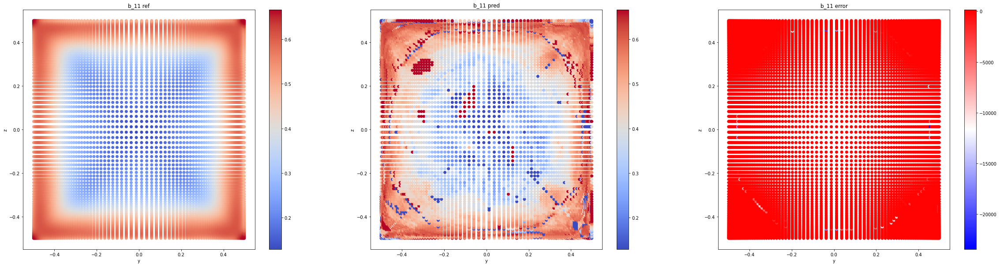

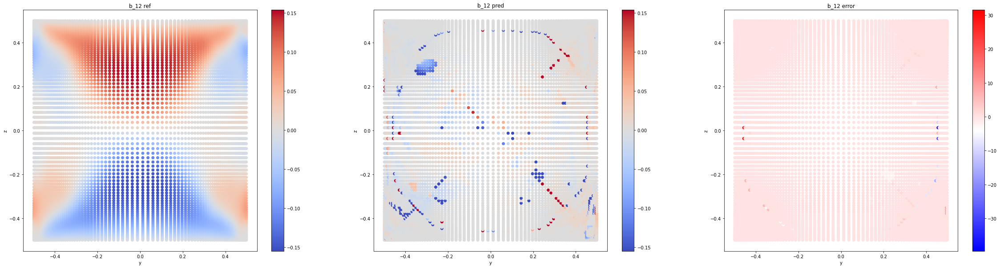

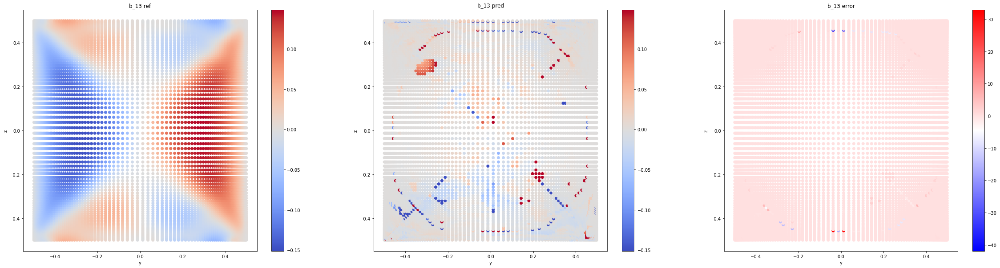

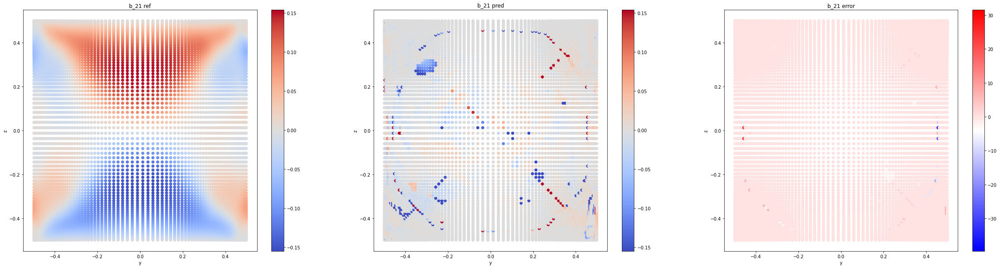

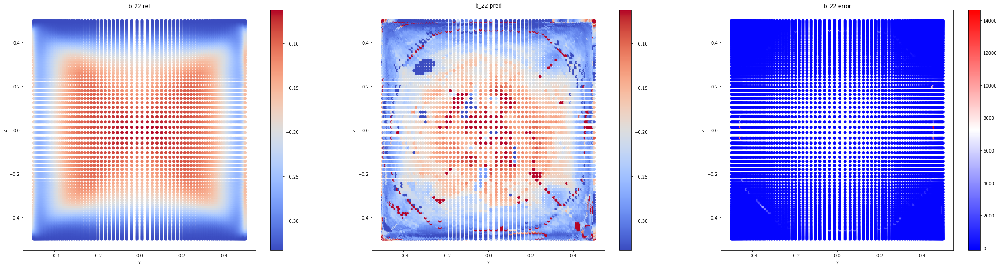

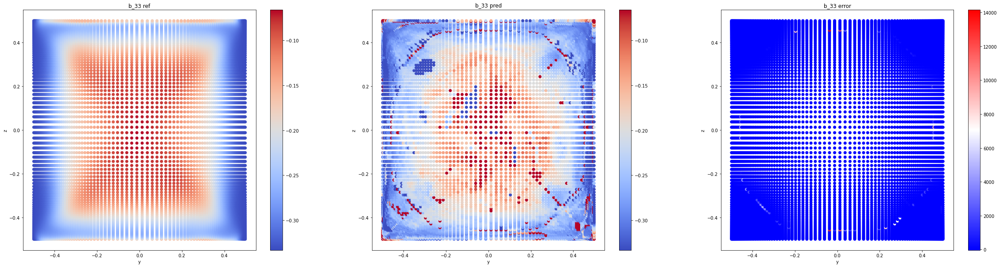

In [22]:
for i, j in ((0,0), (0,1), (0,2), (1,0), (1,1), (2,2)):
    fig = plt.figure(figsize=(40,10))
    ax = fig.add_subplot(1,3,1)
    sc = ax.scatter(y, z, c=b_test[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} ref')
    ax.set_xlabel('y')
    ax.set_ylabel('z')
    fig.colorbar(sc, ax=ax)

    ax = fig.add_subplot(1,3,2)
    sc = ax.scatter(y, z, c=b_pred[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} pred')
    ax.set_xlabel('y')
    ax.set_ylabel('z')
    fig.colorbar(sc, ax=ax)
    
    error = b_pred[:, i, j] - b_test[:, i, j]
    ax = fig.add_subplot(1,3,3)
    sc = ax.scatter(y, z, c=error, cmap='bwr', vmin=np.min(error), vmax=np.max(error))
    ax.set_title(f'b_{i+1}{j+1} error')
    ax.set_xlabel('y')
    ax.set_ylabel('z')
    fig.colorbar(sc, ax=ax)
    
    plt.savefig(f'../plots/{test_case}_TBRF_b{i+1}{j+1}.png', bbox_inches='tight')

    plt.show()

## 2. PHLL_case_1p2

In [23]:
test_case = 'PHLL_case_1p2'

test_tensors = loadCombinedArray([test_case],'Tensors')
test_invariants = loadCombinedArray([test_case],'I1')
test_features = test_invariants.copy()

b_test = loadLabels([test_case],'b')
b_pred, bij_forest, g_forest = tbrf.predict(test_features.T,
                                            test_tensors.reshape((-1, test_tensors.shape[1], 9)).T,
                                            forest)
b_pred = b_pred.T.reshape((-1, 3, 3))

Predicting b_ij, TBRF_v4
Prediction 1
Prediction 2
Prediction 3
Prediction 4
Prediction 5
Prediction 6
Prediction 7
Prediction 8
Prediction 9
Prediction 10


In [24]:
x  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cx.npy')
y  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cy.npy')
z  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cz.npy')

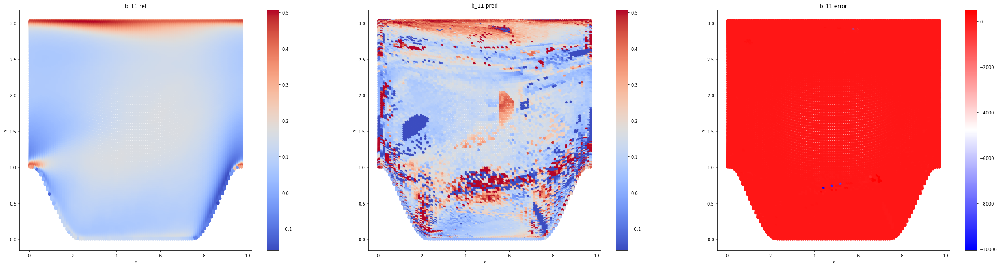

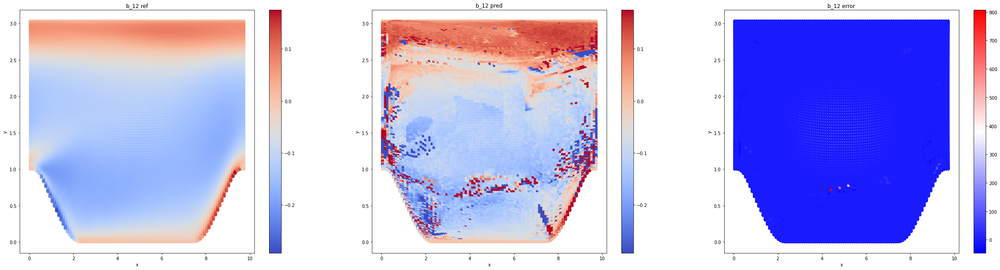

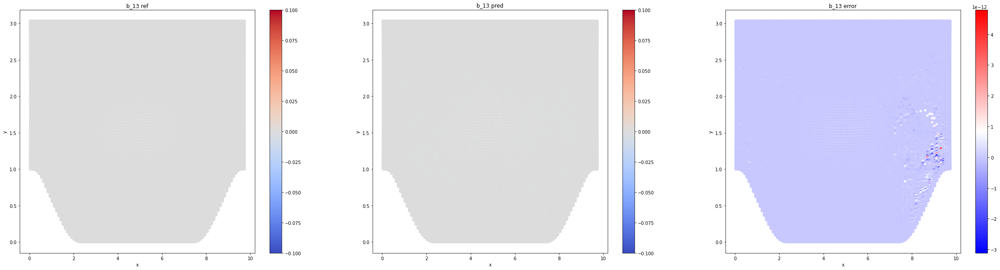

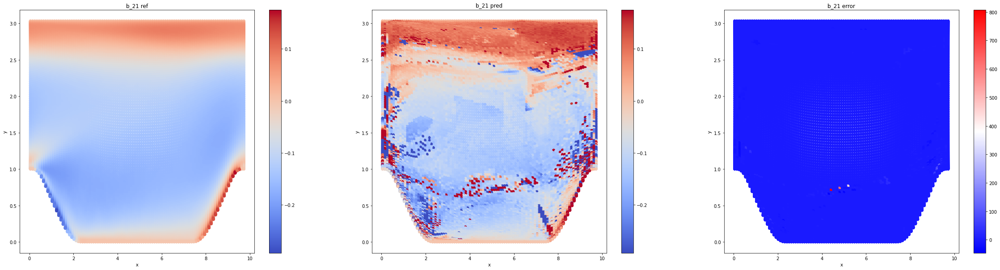

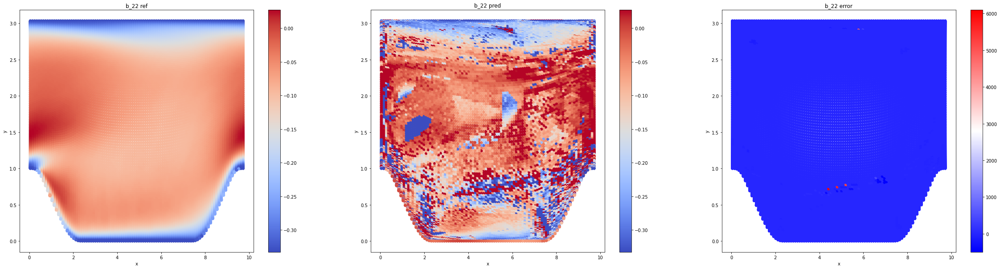

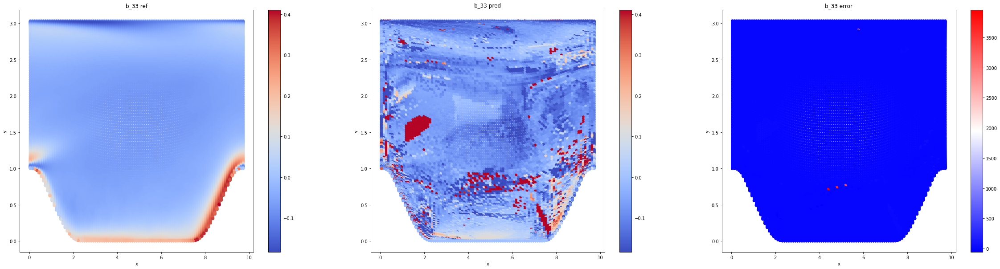

In [25]:
for i, j in ((0,0), (0,1), (0,2), (1,0), (1,1), (2,2)):
    fig = plt.figure(figsize=(40,10))
    ax = fig.add_subplot(1,3,1)
    sc = ax.scatter(x, y, c=b_test[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} ref')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)

    ax = fig.add_subplot(1,3,2)
    sc = ax.scatter(x, y, c=b_pred[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} pred')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)
    
    error = b_pred[:, i, j] - b_test[:, i, j]
    ax = fig.add_subplot(1,3,3)
    sc = ax.scatter(x, y, c=error, cmap='bwr', vmin=np.min(error), vmax=np.max(error))
    ax.set_title(f'b_{i+1}{j+1} error')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)
    
    plt.savefig(f'../plots/{test_case}_TBRF_b{i+1}{j+1}.png', bbox_inches='tight')

    plt.show()

## 3. BUMP_h38

In [26]:
test_case = 'BUMP_h38'

test_tensors = loadCombinedArray([test_case],'Tensors')
test_invariants = loadCombinedArray([test_case],'I1')
test_features = test_invariants.copy()

b_test = loadLabels([test_case],'b')
b_pred, bij_forest, g_forest = tbrf.predict(test_features.T,
                                            test_tensors.reshape((-1, test_tensors.shape[1], 9)).T,
                                            forest)
b_pred = b_pred.T.reshape((-1, 3, 3))

Predicting b_ij, TBRF_v4
Prediction 1
Prediction 2
Prediction 3
Prediction 4
Prediction 5
Prediction 6
Prediction 7
Prediction 8
Prediction 9
Prediction 10


In [27]:
x  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cx.npy')
y  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cy.npy')
z  = np.load(f'../data/{dataset}/{dataset}_{test_case}_Cz.npy')

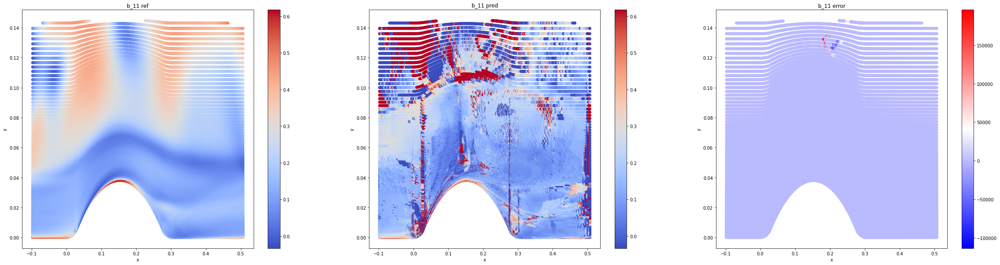

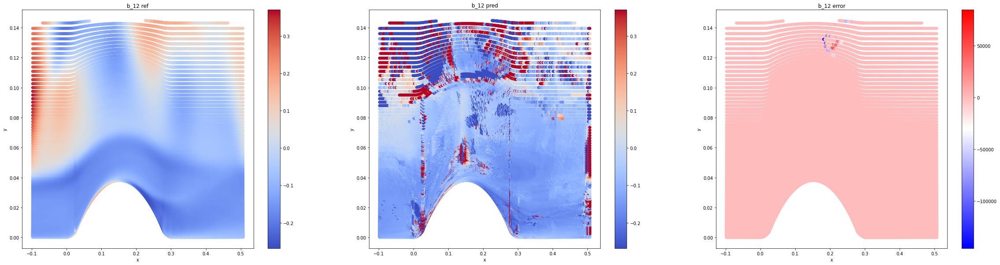

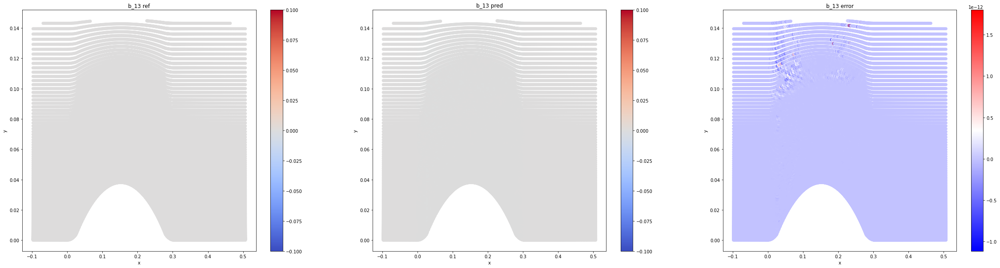

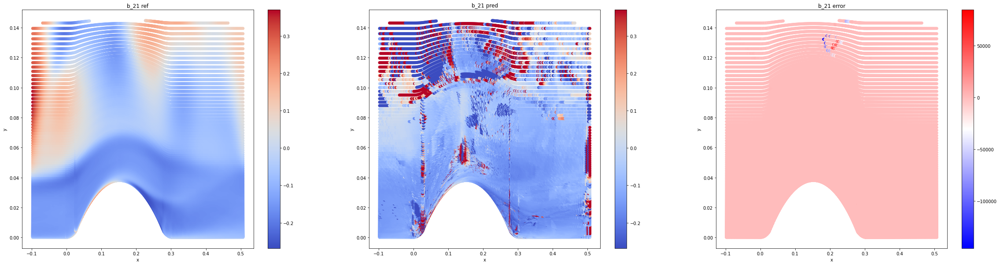

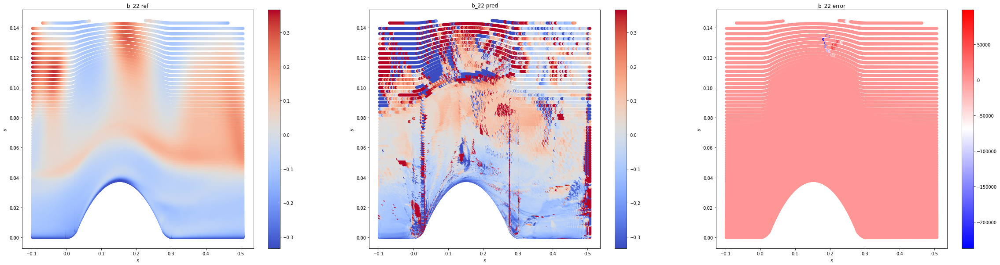

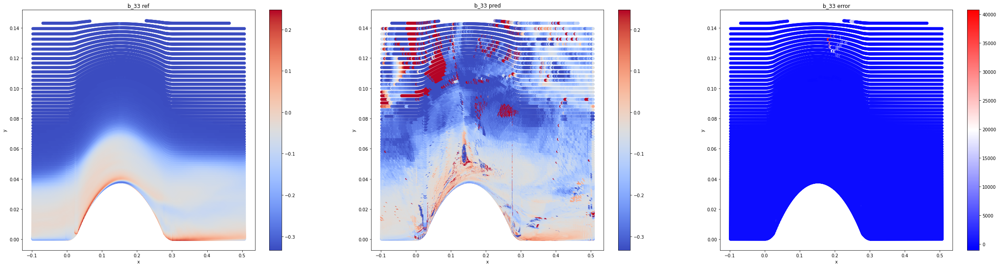

In [28]:
for i, j in ((0,0), (0,1), (0,2), (1,0), (1,1), (2,2)):
    fig = plt.figure(figsize=(40,10))
    ax = fig.add_subplot(1,3,1)
    sc = ax.scatter(x, y, c=b_test[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} ref')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)

    ax = fig.add_subplot(1,3,2)
    sc = ax.scatter(x, y, c=b_pred[:, i, j], cmap=cm.coolwarm, vmin=b_test[:, i, j].min(), vmax=b_test[:, i, j].max())
    ax.set_title(f'b_{i+1}{j+1} pred')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)
    
    error = b_pred[:, i, j] - b_test[:, i, j]
    ax = fig.add_subplot(1,3,3)
    sc = ax.scatter(x, y, c=error, cmap='bwr', vmin=np.min(error), vmax=np.max(error))
    ax.set_title(f'b_{i+1}{j+1} error')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    fig.colorbar(sc, ax=ax)
    
    plt.savefig(f'../plots/{test_case}_TBRF_b{i+1}{j+1}.png', bbox_inches='tight')

    plt.show()